# Instrumentation to Generate and prune single instruction

In [1]:
import chipwhisperer as cw
from utils import IbexChipWhisperer, DataGenerator, DataSynthesizer, DataWrangler 
from riscv32_isg import *
import os, time
import numpy as np

In [2]:
def readLabels(sw_name, datgen):
    sw_dir = datgen.get_dir(sw_name)
    labels_path = os.path.join(sw_dir, "label_instr.txt")
    with open(labels_path, "r") as f:
        labels = f.read()
    return labels

def pretty_print_instructions(instructions):
    """
    Pretty print instruction labels with prefix, generated instructions, and suffix highlighted.
    
    Args:
        instructions: List of instruction strings or a single multi-line string
    
    Returns:
        dict: parsed_dict
            where parsed_dict contains:
            {
                'prefix': list of prefix instructions,
                'core': list of generated instructions,
                'suffix': list of suffix instructions,
                'first_cmv_index': index of first c.mv,
                'last_cmv_index': index of last c.mv,
                'total_count': total number of instructions
            }
    """
    
    # Handle both string and list inputs
    if isinstance(instructions, str):
        inst_list = [line.strip() for line in instructions.strip().split('\n') if line.strip()]
    else:
        inst_list = instructions
    
    # Find first and last c.mv positions
    first_cmv = None
    last_cmv = None
    
    for i, inst in enumerate(inst_list):
        if inst == 'c.mv':
            if first_cmv is None:
                first_cmv = i
            last_cmv = i
    
    if first_cmv is None:
        print("No c.mv instructions found!")
        return len(inst_list), {
            'prefix': inst_list,
            'core': [],
            'suffix': [],
            'first_cmv_index': None,
            'last_cmv_index': None,
            'total_count': len(inst_list)
        }
    
    # Extract sections
    prefix = inst_list[:first_cmv + 1]  # Include first c.mv in prefix
    core = inst_list[first_cmv + 1:last_cmv]  # Between first and last c.mv (exclusive)
    suffix = inst_list[last_cmv:]  # Include last c.mv in suffix
    
    # Create result dictionary
    parsed_dict = {
        'prefix': prefix,
        'core': core,
        'suffix': suffix,
        'first_cmv_index': first_cmv,
        'last_cmv_index': last_cmv,
        'total_count': len(inst_list)
    }
    
    # ANSI color codes
    class Colors:
        HEADER = '\033[95m'
        OKBLUE = '\033[94m'
        OKCYAN = '\033[96m'
        OKGREEN = '\033[92m'
        WARNING = '\033[93m'
        FAIL = '\033[91m'
        ENDC = '\033[0m'
        BOLD = '\033[1m'
        UNDERLINE = '\033[4m'
    
    # Print with formatting
    print(f"\n{Colors.BOLD}{'='*50}{Colors.ENDC}")
    print(f"{Colors.BOLD}  INSTRUCTION ANALYSIS{Colors.ENDC}")
    print(f"{Colors.BOLD}{'='*50}{Colors.ENDC}\n")
    
    # Print prefix
    if len(prefix) > 0:
        print(f"{Colors.OKBLUE}{Colors.BOLD}PREFIX:{Colors.ENDC}")
        print(f"  {Colors.OKBLUE}┌─ {Colors.BOLD}(begin){Colors.ENDC}")
        for i, inst in enumerate(prefix[:-1]):  # All except last (which is the boundary c.mv)
            print(f"  {Colors.OKBLUE}├─ {inst}{Colors.ENDC}")
        print(f"  {Colors.OKBLUE}└─ {prefix[-1]} {Colors.BOLD}(boundary){Colors.ENDC}")
        print()
    
    # Print generated instructions (core)
    if len(core) > 0:
        print(f"{Colors.OKGREEN}{Colors.BOLD}GENERATED INSTRUCTIONS:{Colors.ENDC}")
        for inst in core:
            print(f"  {Colors.OKGREEN}• {inst}{Colors.ENDC}")
        print()
    
    # Print suffix
    if len(suffix) > 0:
        print(f"{Colors.WARNING}{Colors.BOLD}SUFFIX:{Colors.ENDC}")
        print(f"  {Colors.WARNING}┌─ {suffix[0]} {Colors.BOLD}(boundary){Colors.ENDC}")
        for inst in suffix[1:]:  # All except first (which is the boundary c.mv)
            print(f"  {Colors.WARNING}├─ {inst}{Colors.ENDC}")
        print(f"  {Colors.WARNING}└─ {Colors.BOLD}(end){Colors.ENDC}")
    
    # Print summary
    total_instructions = len(inst_list)
    print(f"\n{Colors.BOLD}SUMMARY:{Colors.ENDC}")
    print(f"  Prefix instructions: {Colors.OKBLUE}{len(prefix)}{Colors.ENDC}")
    print(f"  Generated instructions: {Colors.OKGREEN}{len(core)}{Colors.ENDC}")
    print(f"  Suffix instructions: {Colors.WARNING}{len(suffix)}{Colors.ENDC}")
    print(f"  Total instructions: {Colors.BOLD}{total_instructions}{Colors.ENDC}")
    print(f"{Colors.BOLD}{'='*50}{Colors.ENDC}\n")
    
    return parsed_dict

CYCLE_LENGTH = 16

# Generation

In [3]:
# Program FGPA with ibex and connect Chipwhisperer
try:
    icw.disconnect()
except:
    pass
    
bitstream = "ibex_12MHz_512KRAM.bit"  # 12.5 MHz allowing for 16x oversampling

icw = IbexChipWhisperer(oversampling_factor=CYCLE_LENGTH)
icw.program_fpga(bitstream=bitstream)
icw.connect()

(ChipWhisperer Target WARNING|File CW305.py:508) No FPGA Bitstream file specified.


✅ FPGA programmed. Next you need to program the firmware using the load_demo_system.sh command from the Ibex repository.
INFO: Found ChipWhisperer😍
scope.gain.mode                          changed from low                       to high                     
scope.gain.gain                          changed from 0                         to 22                       
scope.gain.db                            changed from 15.0                      to 25.091743119266056       
scope.adc.samples                        changed from 131124                    to 5000                     
scope.clock.clkgen_freq                  changed from 0                         to 7363636.363636363        
scope.clock.adc_freq                     changed from 0                         to 29454545.454545453       
scope.io.tio1                            changed from serial_tx                 to serial_rx                
scope.io.tio2                            changed from serial_rx                 to serial

(ChipWhisperer Scope WARNING|File ChipWhispererHuskyClock.py:524) ADC frequency must be between 1MHz and 300000000.0MHz - ADC mul has been adjusted to 3
(ChipWhisperer Scope WARNING|File ChipWhispererHuskyClock.py:527) ADC frequency exceeds specification (200 MHz). 
            This may or may not work, depending on temperature, voltage, and luck.
            It may not work reliably.
            You can run scope.adc_test() to check whether ADC data is sampled properly by the FPGA,
            but this doesn't fully verify that the ADC is working properly.
            Set scope.clock.pll._no_warning_freq if you don't want
            to see this message anymore.
            


In [3]:
def generateInstruction(instruction, icw, number=1, repetition=0):
    """
    instruction: str - the instruction to generate
    """
    # Generate .c file
    sw_name = f"singleton_{number}_{instruction}_{repetition}".replace(".","_") # In case of compressed instructions
    
    try:
        datsynth = DataSynthesizer(allowed_instructions={instruction})
        datsynth.gen_c_file(sw_name, number, overwrite=True, allow_nop_fill=True)
    except Exception as e:
        raise RuntimeError(f"Failed to generate C file: {e}")
    
    # Compile binary
    try:
        datgen = DataGenerator()
        datgen.build_software(sw_name, force=True)
    except Exception as e:
        raise RuntimeError(f"Failed to compile binary: {e}")
    
    # Label with Spike
    try:
        datgen.generate_labels(sw_name, force=True)
    except Exception as e:
        raise RuntimeError(f"Failed to generate labels: {e}")
    
    try:
        labels = readLabels(sw_name, datgen)
        metadata = pretty_print_instructions(labels)
    except Exception as e:
        raise RuntimeError(f"Failed to read/parse labels: {e}")
    
    # Check instruction count in core
    core = metadata["core"]
    instruction_count = core.count(instruction)
    if instruction_count != number:
        raise ValueError(f"Expected {number} '{instruction}' in core, found {instruction_count}")
    
    # Trace
    try:
        datgen.generate_data(sw_name, icw, repetitions=1, force=True)
        metadata["trace_length"] = len(datgen.last_trace)
    except Exception as e:
        raise RuntimeError(f"Failed to generate trace: {e}")
    
    return metadata

In [4]:
#loop = True
#while loop:
#    REFERENCE = generateInstruction("nop", icw, number=1)
#    if REFERENCE["trace_length"] == 416:  # Ensure pre- and suf-fix only has one load/store pair.
#        break

# Hardcoded, but created by running the above.
REFERENCE = {
 'prefix': ['c.addi', 'c.swsp', 'auipc', 'addi', 'c.mv'],
 'core': ['nop'],
 'suffix': ['c.mv', 'c.lwsp', 'c.li', 'c.addi', 'ret', 'c.jal'],
 'first_cmv_index': 4,
 'last_cmv_index': 6,
 'total_count': 12,
 'trace_length': 416
}

In [5]:
REFERENCE

{'prefix': ['c.addi', 'c.swsp', 'auipc', 'addi', 'c.mv'],
 'core': ['nop'],
 'suffix': ['c.mv', 'c.lwsp', 'c.li', 'c.addi', 'ret', 'c.jal'],
 'first_cmv_index': 4,
 'last_cmv_index': 6,
 'total_count': 12,
 'trace_length': 416}

In [6]:
# These are determined iteratively using generateAndFindLength, except nop is used as a base.
INSTRUCTION_CYCLES = {
    "nop" : 1, 
    "c.addi" : 1, 
    "auipc" : 1, 
    "addi" : 1, 
    "c.mv" : 1, 
    "c.swsp" : 2, 
    "c.lwsp" : 2, 
    "c.li" : 1, 
    "ret" : 2, # NOTE: ret is a pseudoinstruction equivalent to jalr
    "jalr" : 2, # https://github.com/riscv-non-isa/riscv-asm-manual/blob/main/src/asm-manual.adoc#a-listing-of-standard-risc-v-pseudoinstructions
    "c.jal" : 2,
    "jal" : 2
}
# NOTE: load/stores stall at least one cycle, so we expect 32 or more, https://ibex-core.readthedocs.io/en/latest/03_reference/pipeline_details.html

INSTRUCTION_LENGTHS = {key: val * CYCLE_LENGTH for key, val in INSTRUCTION_CYCLES.items()}

In [7]:
def generateAndFindLength(instruction, icw):
    """
    Finds trace length of single instruction
    """
    loop = True
    while loop:
        try:
            metadata = generateInstruction(instruction, icw, number=1)
        except:
            continue

        presuf_len = 400 # magic number, found manually
        core_len = metadata["trace_length"] - presuf_len
        
        if metadata["prefix"] == REFERENCE["prefix"] and metadata["suffix"] == REFERENCE["suffix"]:
            for inst in metadata["core"]:
                if inst == instruction:
                    continue
                elif inst in INSTRUCTION_LENGTHS:
                    core_len -= INSTRUCTION_LENGTHS[inst]
                else:
                    raise Exception("Unseen instruction needed to calculate length")
        else:
            continue

        loop = False
            
    return core_len

# Create Singleton Corpus

In this section we build a corpus of single instruction executions - from which the pre- and suf-fix are removed later.
We repeat measurements for each instructions, with a wait in between, as I have observed large variations in noise over time.

In [8]:
def generateCorpus(instructions, repeats, wait_time):
    for repetition in range(repeats):
        for inst in instructions:
            while True:
                try:
                    metadata = generateInstruction(inst, icw, number=1, repetition=repetition)
                    if metadata["prefix"] != REFERENCE["prefix"]:
                        continue
                except:
                    continue
                break
                

        print(f"Repetition {repetition} completed. Waiting before commencing next round...")
        time.sleep(wait_time)
        

In [9]:
R_INSTRUCTIONS = ["nop", "add", "sub", "and", "or", "xor", "sll", "srl", "sra", "slt", "sltu"]
I_INSTRUCTIONS = ["addi", "andi", "ori", "xori", "slli", "srli", "srai", "slti"]
LOAD_INSTRUCTIONS = ["lb", "lh", "lw", "lbu", "lhu"]
STORE_INSTRUCTIONS = ["sb", "sh", "sw"]
B_INSTRUCTIONS = ["beq", "bne", "blt", "bge", "bltu", "bgeu"]
OTHER_INSTRUCTION = ["jal", "lui", "auipc"]

INSTRUCTIONS = R_INSTRUCTIONS + I_INSTRUCTIONS + LOAD_INSTRUCTIONS + STORE_INSTRUCTIONS + B_INSTRUCTIONS + OTHER_INSTRUCTION

In [ ]:
generateCorpus(INSTRUCTIONS, 5, 2)

# Manually find key instruction lengths

In [11]:
#generateAndFindLength("c.jal", icw)

# Investigate Trace Structure

In [10]:
REFERENCE

{'prefix': ['c.addi', 'c.swsp', 'auipc', 'addi', 'c.mv'],
 'core': ['nop'],
 'suffix': ['c.mv', 'c.lwsp', 'c.li', 'c.addi', 'ret', 'c.jal'],
 'first_cmv_index': 4,
 'last_cmv_index': 6,
 'total_count': 12,
 'trace_length': 416}

In [11]:
tot = 0
full = REFERENCE["prefix"]+REFERENCE["core"]+REFERENCE["suffix"]
for inst in full:
    tot += INSTRUCTION_LENGTHS[inst]
tot

256

This means the chipwhisperer before the end of trigger_high and/or after the beginning of trigger_low.
Perhaps unsurprisingly. But that means it will be more difficult to prune the prefix and suffix.

In [14]:
generateInstruction("nop", icw, number=10)


=== Building software: singleton_10_nop_0 ===
Building file: /home/eduemat/chipwhisperer_lab/software/src/singleton_10_nop_0/singleton_10_nop_0.c
Successfully built singleton_10_nop_0
Generating symbols
Generating Spike command file
Running Spike script

  INSTRUCTION ANALYSIS

PREFIX:
  ┌─ (begin)
  ├─ c.addi
  ├─ c.swsp
  ├─ auipc
  ├─ addi
  └─ c.mv (boundary)

GENERATED INSTRUCTIONS:
  • nop
  • nop
  • nop
  • nop
  • nop
  • nop
  • nop
  • nop
  • nop
  • nop

SUFFIX:
  ┌─ c.mv (boundary)
  ├─ c.lwsp
  ├─ c.li
  ├─ c.addi
  ├─ ret
  ├─ c.jal
  └─ (end)

SUMMARY:
  Prefix instructions: 5
  Generated instructions: 10
  Suffix instructions: 6
  Total instructions: 21


=== Generating data for: singleton_10_nop_0 ===
Executing command: /home/eduemat/chipwhisperer_lab/ibex-demo-system/util/load_demo_system.sh run /home/eduemat/chipwhisperer_lab/software/src/singleton_10_nop_0/singleton_10_nop_0-CW305_IBEX.hex
Command executed successfully!
Output:
Successfully captured trace of leng

Open On-Chip Debugger 0.12.0
Licensed under GNU GPL v2
For bug reports, read
	http://openocd.org/doc/doxygen/bugs.html
force hard breakpoints
Info : ftdi: if you experience problems at higher adapter clocks, try the command "ftdi tdo_sample_edge falling"
Info : clock speed 10000 kHz
Info : JTAG tap: riscv.cpu tap/device found: 0x13631093 (mfg: 0x049 (Xilinx), part: 0x3631, ver: 0x1)
Info : datacount=2 progbufsize=8
Info : Examined RISC-V core; found 1 harts
Info :  hart 0: XLEN=32, misa=0x40101104
Info : starting gdb server for riscv.cpu on 3333
Info : Listening on port 3333 for gdb connections
2264 bytes written at address 0x00100000
downloaded 2264 bytes in 0.040663s (54.372 KiB/s)

verified 2264 bytes in 0.039264s (56.310 KiB/s)

Doing reset
Info : JTAG tap: riscv.cpu tap/device found: 0x13631093 (mfg: 0x049 (Xilinx), part: 0x3631, ver: 0x1)


{'prefix': ['c.addi', 'c.swsp', 'auipc', 'addi', 'c.mv'],
 'core': ['nop',
  'nop',
  'nop',
  'nop',
  'nop',
  'nop',
  'nop',
  'nop',
  'nop',
  'nop'],
 'suffix': ['c.mv', 'c.lwsp', 'c.li', 'c.addi', 'ret', 'c.jal'],
 'first_cmv_index': 4,
 'last_cmv_index': 15,
 'total_count': 21,
 'trace_length': 560}

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
import re

datgen = DataGenerator()

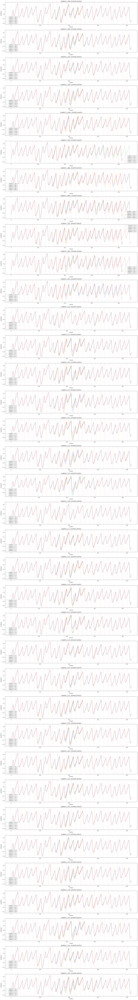

In [13]:
def plot_singleton_traces(datgen, prune=(0, 0)):
    """
    Plot singleton traces grouped by base name with optional pruning.
    
    Parameters:
    -----------
    datgen : DataGenerator
        The data generator instance to get software directories from
    prune : tuple of (int, int), optional
        Number of instruction cycles to trim from (left, right). Default is (0, 0).
        Each instruction cycle is CYCLE_LENGTH samples.
    """
    sw_paths = datgen.get_software_directories()
    
    # First, collect valid traces and group by base name
    valid_traces = []
    for path in sw_paths:
        if not path.split("/")[-1].startswith("singleton_1_"):
            continue # Skip all but the true singletons
        trace_path = os.path.join(path, "trace.npy")
        try:
            trace = np.load(trace_path)[0]  # flatten
            sw_name = os.path.basename(path)
            valid_traces.append((trace, sw_name))
        except FileNotFoundError:
            print(f"Warning: No trace.npy found in {path}")
            continue
        except Exception as e:
            print(f"Error loading trace from {path}: {e}")
            continue
    
    # Group traces by base name (removing suffix integer)
    grouped_traces = {}
    for trace, sw_name in valid_traces:
        # Remove trailing digits to get base name
        base_name = re.sub(r'\d+$', '', sw_name)
        if base_name not in grouped_traces:
            grouped_traces[base_name] = []
        grouped_traces[base_name].append((trace, sw_name))
    
    # Apply pruning to all traces
    prune_left_samples = prune[0] * CYCLE_LENGTH  # Convert instruction cycles to samples
    prune_right_samples = prune[1] * CYCLE_LENGTH
    
    if prune_left_samples > 0 or prune_right_samples > 0:
        pruned_grouped_traces = {}
        for base_name, traces_group in grouped_traces.items():
            pruned_traces = []
            for trace, sw_name in traces_group:
                # Calculate end index for pruning
                end_idx = len(trace) - prune_right_samples if prune_right_samples > 0 else len(trace)
                
                # Apply pruning
                if prune_left_samples < len(trace) and end_idx > prune_left_samples:
                    pruned_trace = trace[prune_left_samples:end_idx]
                    pruned_traces.append((pruned_trace, sw_name))
                else:
                    print(f"Warning: Pruning would remove entire trace for {sw_name}")
                    pruned_traces.append((trace, sw_name))  # Keep original if pruning is too aggressive
            
            if pruned_traces:  # Only add if there are valid traces after pruning
                pruned_grouped_traces[base_name] = pruned_traces
        
        grouped_traces = pruned_grouped_traces
    
    # Calculate subplot layout based on number of groups
    n_groups = len(grouped_traces)
    if n_groups == 0:
        print("No valid traces found!")
        return
    
    fig, axes = plt.subplots(n_groups, 1, figsize=(20, 4*n_groups))
    
    # Handle case where there's only one subplot
    if n_groups == 1:
        axes = [axes]
    else:
        axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]
    
    # Plot each group in its own subplot
    for i, (base_name, traces_group) in enumerate(grouped_traces.items()):
        # Plot all traces in this group on the same subplot
        for trace, sw_name in traces_group:
            axes[i].plot(trace, alpha=0.7, linewidth=1, label=sw_name)
        
        # Add vertical bars every CYCLE_LENGTH samples for instruction cycles
        # Use the first trace to determine length
        trace_length = len(traces_group[0][0])
        for cycle_start in range(0, trace_length, CYCLE_LENGTH):
            axes[i].axvline(x=cycle_start, color='red', linestyle='--', 
                           alpha=0.5, linewidth=0.8, zorder=0)
        
        axes[i].set_xlabel("Sample")
        axes[i].set_ylabel("Amplitude")
        
        # Update title to show pruning information
        title = f"{base_name} (overlaid variants)"
        if prune != (0, 0):
            title += f" [pruned: {prune[0]} left, {prune[1]} right cycles]"
        axes[i].set_title(title)
        axes[i].legend()
    
    plt.tight_layout()
    plt.show()
    return n_groups

n_groups = plot_singleton_traces(datgen)

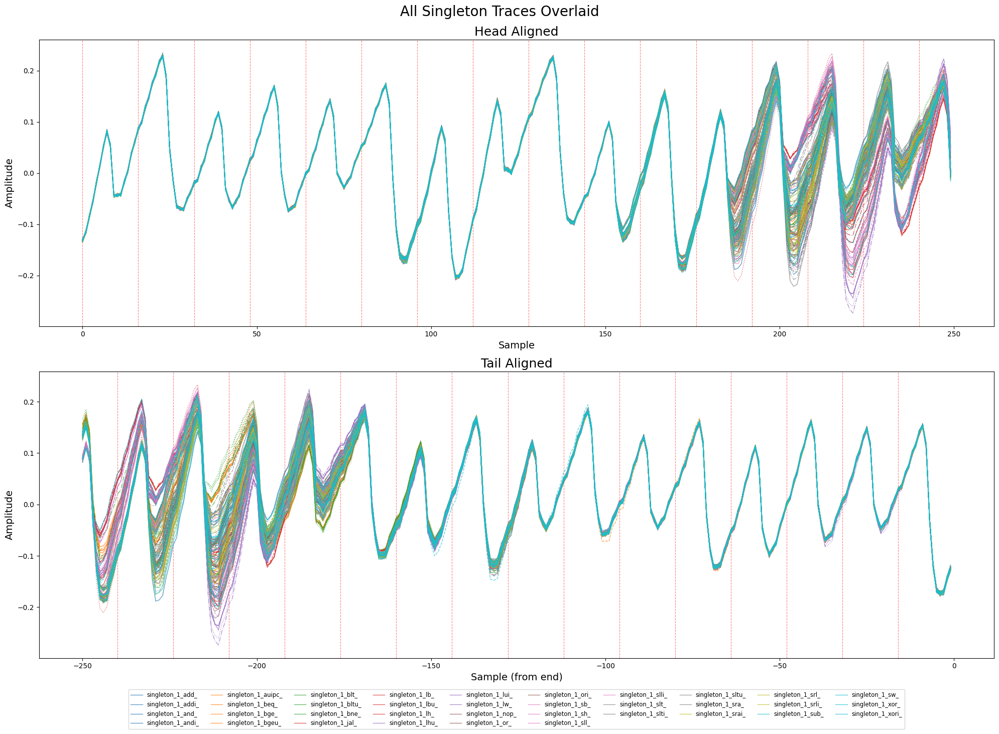

In [30]:
plt.figure(figsize=(20, 16))
sw_paths = datgen.get_software_directories()
    
# First, collect valid traces and group by base name
valid_traces = []
for path in sw_paths:
    if not path.split("/")[-1].startswith("singleton_1_"):
        continue # Skip all but the true singletons
    trace_path = os.path.join(path, "trace.npy")
    try:
        trace = np.load(trace_path)[0]  # flatten
        sw_name = os.path.basename(path)
        valid_traces.append((trace, sw_name))
    except FileNotFoundError:
        print(f"Warning: No trace.npy found in {path}")
        continue
    except Exception as e:
        print(f"Error loading trace from {path}: {e}")
        continue

# Group traces by base name (removing suffix integer)
grouped_traces = {}
for trace, sw_name in valid_traces:
    # Remove trailing digits to get base name
    base_name = re.sub(r'\d+$', '', sw_name)
    if base_name not in grouped_traces:
        grouped_traces[base_name] = []
    grouped_traces[base_name].append((trace, sw_name))
    
n_groups = len(grouped_traces)
if n_groups == 0:
    print("No valid traces found!")

# Define colors for different groups
colors = plt.cm.tab10(np.linspace(0, 1, n_groups))

# First subplot - original alignment (head alignment) - first 250 samples
plt.subplot(2, 1, 1)
for group_idx, (base_name, traces_group) in enumerate(grouped_traces.items()):
    for trace_idx, (trace, sw_name) in enumerate(traces_group):
        # Use different line styles for variants within the same group
        line_styles = ['-', '--', '-.', ':']
        style = line_styles[trace_idx % len(line_styles)]
        
        # Plot only first 250 samples
        trace_crop = trace[:250]
        # Only label the first trace in each group (base name)
        label = base_name if trace_idx == 0 else None
        plt.plot(trace_crop, alpha=0.7, linewidth=1, 
                color=colors[group_idx], linestyle=style,
                label=label)

# Add vertical bars every CYCLE_LENGTH samples for instruction cycles
if valid_traces:
    for cycle_start in range(0, 250, CYCLE_LENGTH):
        plt.axvline(x=cycle_start, color='red', linestyle='--', 
                   alpha=0.5, linewidth=0.8, zorder=0)
        
plt.xlabel("Sample", fontsize=14)
plt.ylabel("Amplitude", fontsize=14)
plt.title("Head Aligned", fontsize=18)

# Second subplot - tail alignment - last 250 samples
plt.subplot(2, 1, 2)
for group_idx, (base_name, traces_group) in enumerate(grouped_traces.items()):
    for trace_idx, (trace, sw_name) in enumerate(traces_group):
        # Use different line styles for variants within the same group
        line_styles = ['-', '--', '-.', ':']
        style = line_styles[trace_idx % len(line_styles)]
        
        # Get last 250 samples
        trace_crop = trace[-250:]
        # Create reverse x-axis (negative indices from the end)
        x_reverse = np.arange(-250, 0)  # -250 to -1
        
        # Only label the first trace in each group (base name)
        label = base_name if trace_idx == 0 else None
        plt.plot(x_reverse, trace_crop, alpha=0.7, linewidth=1, 
                color=colors[group_idx], linestyle=style,
                label=label)

# Add vertical bars every CYCLE_LENGTH samples for instruction cycles (from the tail)
if valid_traces:
    for cycle_end in range(-CYCLE_LENGTH, -251, -CYCLE_LENGTH):
        plt.axvline(x=cycle_end, color='red', linestyle='--', 
                   alpha=0.5, linewidth=0.8, zorder=0)

plt.xlabel("Sample (from end)", fontsize=14)
plt.ylabel("Amplitude", fontsize=14)
plt.title("Tail Aligned", fontsize=18)
plt.legend(bbox_to_anchor=(0.5, -0.1), loc='upper center', 
          ncol=min(len(grouped_traces), 10), fontsize='small')

# Set the suptitle first
title = "All Singleton Traces Overlaid"
plt.suptitle(title, fontsize=20, y=0.94)

# Use tight_layout with rect parameter to leave space for suptitle
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.savefig(f'figures/{"_".join(title.replace("/","_").split(" "))}')
plt.show()

The head and tail alignment is abundantly clear here, we use this to find the not accounted for trace length, so we can prune systematically.

They should sum to 25, as the preamble/epilogue only trace has length 400 --> 25 cycles.
Tail is chosen as 12, despite cycle 11 and 12 showing some dissimilarity, as this is likely residual differences from the preceding instruction variance.
With this, the sum is 23, and we have a buffer of a single instruction cycle before pruning, which seems reasonable.

In [24]:
head_cycles_empirical, tail_cycles_empirical = 11, 12 # Note, should likely be incremented, but hard to tell, so we allow buffer
head_cycles_theoretical = sum([INSTRUCTION_CYCLES[inst] for inst in REFERENCE["prefix"]])
tail_cycles_theoretical = sum([INSTRUCTION_CYCLES[inst] for inst in REFERENCE["suffix"]])
head_unaccounted = head_cycles_empirical - head_cycles_theoretical
tail_unaccounted = tail_cycles_empirical - tail_cycles_theoretical

print("=" * 60)
print("INSTRUCTION CYCLE SUMMARY")
print("=" * 60)
print()

print("HEAD (Prefix):")
print(f"  Empirical cycles:   {head_cycles_empirical:2d}")
print(f"  Theoretical cycles: {head_cycles_theoretical:2d}")
print(f"  Unaccounted cycles: {head_unaccounted:2d} {'✓' if head_unaccounted >= 0 else '⚠️'}")
print()

print("TAIL (Suffix):")
print(f"  Empirical cycles:   {tail_cycles_empirical:2d}")
print(f"  Theoretical cycles: {tail_cycles_theoretical:2d}")
print(f"  Unaccounted cycles: {tail_unaccounted:2d} {'✓' if tail_unaccounted >= 0 else '⚠️'}")
print()

print("=" * 60)

INSTRUCTION CYCLE SUMMARY

HEAD (Prefix):
  Empirical cycles:   11
  Theoretical cycles:  6
  Unaccounted cycles:  5 ✓

TAIL (Suffix):
  Empirical cycles:   12
  Theoretical cycles:  9
  Unaccounted cycles:  3 ✓



In [25]:
REFERENCE

{'prefix': ['c.addi', 'c.swsp', 'auipc', 'addi', 'c.mv'],
 'core': ['nop'],
 'suffix': ['c.mv', 'c.lwsp', 'c.li', 'c.addi', 'ret', 'c.jal'],
 'first_cmv_index': 4,
 'last_cmv_index': 6,
 'total_count': 12,
 'trace_length': 416}

# Prune

Try pruning the trace using the known pre- and suf-fix, as well as the surplus cycles.

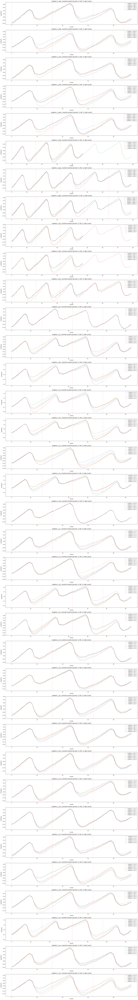

36

In [26]:
plot_singleton_traces(datgen, prune=(head_cycles_empirical,tail_cycles_empirical))

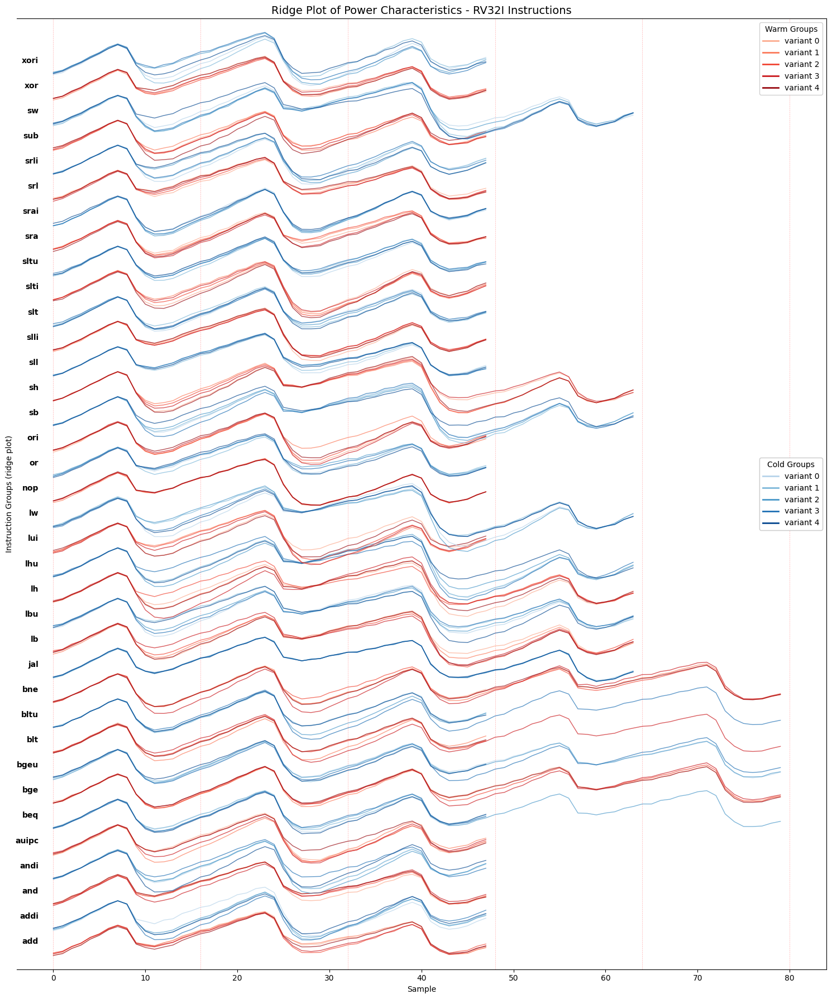

In [72]:
import os
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

def plot_singleton_traces_ridge(datgen, prune=(0, 0), ridge_spacing=1.0, alpha=0.7, 
                                filter_instructions=None, height_scale=1, title=None,
                                save = False, plot_width=20):
    """
    Plot singleton traces as ridge plots grouped by instruction with variants colored by N suffix.
    
    Parameters:
    -----------
    datgen : DataGenerator
        The data generator instance to get software directories from
    prune : tuple of (int, int), optional
        Number of instruction cycles to trim from (left, right). Default is (0, 0).
        Each instruction cycle is CYCLE_LENGTH samples.
    ridge_spacing : float, optional
        Vertical spacing between ridge groups. Default is 1.0.
    alpha : float, optional
        Transparency of the trace lines. Default is 0.7.
    filter_instructions : list of str, optional
        List of instruction names to plot. If None, plots all instructions. Default is None.
    height_scale : float, optional
        Factor with which to scale the y-axis.
    """
    sw_paths = datgen.get_software_directories()
    
    # First, collect valid traces and parse directory names
    valid_traces = []
    for path in sw_paths:
        dirname = path.split("/")[-1]
        if not dirname.startswith("singleton_1_"):
            continue # Skip all but the true singletons
            
        trace_path = os.path.join(path, "trace.npy")
        try:
            trace = np.load(trace_path)[0]  # flatten
            
            # Parse the directory name: singleton_1_$INSTR_$N
            parts = dirname.split("_")
            if len(parts) >= 4:
                instr = parts[2]  # The instruction part
                n_suffix = parts[3]  # The N suffix
                valid_traces.append((trace, dirname, instr, n_suffix))
            else:
                print(f"Warning: Unexpected directory format: {dirname}")
                continue
                
        except FileNotFoundError:
            print(f"Warning: No trace.npy found in {path}")
            continue
        except Exception as e:
            print(f"Error loading trace from {path}: {e}")
            continue
    
    # Group traces by instruction
    grouped_traces = {}
    all_n_suffixes = set()
    
    for trace, dirname, instr, n_suffix in valid_traces:
        # Apply instruction filtering if specified
        if filter_instructions is not None and instr not in filter_instructions:
            continue
            
        if instr not in grouped_traces:
            grouped_traces[instr] = []
        grouped_traces[instr].append((trace, dirname, n_suffix))
        all_n_suffixes.add(n_suffix)
    
    # Sort N suffixes for consistent coloring
    sorted_n_suffixes = sorted(all_n_suffixes, key=lambda x: int(x) if x.isdigit() else float('inf'))
    
    # Sort instruction groups for consistent ordering
    sorted_instrs = sorted(grouped_traces.keys())
    
    # Create alternating warm/cold color schemes for different instruction groups
    warm_colors = cm.Reds(np.linspace(0.3, 0.9, max(1, len(sorted_n_suffixes))))
    cold_colors = cm.Blues(np.linspace(0.3, 0.9, max(1, len(sorted_n_suffixes))))
    
    # Create color maps for each instruction group
    instruction_color_maps = {}
    for i, instr in enumerate(sorted_instrs):
        if i % 2 == 0:  # Even indices get warm colors
            instruction_color_maps[instr] = {n_suffix: warm_colors[j] 
                                           for j, n_suffix in enumerate(sorted_n_suffixes)}
        else:  # Odd indices get cold colors
            instruction_color_maps[instr] = {n_suffix: cold_colors[j] 
                                           for j, n_suffix in enumerate(sorted_n_suffixes)}
    
    # Apply pruning to all traces
    prune_left_samples = prune[0] * CYCLE_LENGTH if 'CYCLE_LENGTH' in globals() else prune[0] * 100  # fallback
    prune_right_samples = prune[1] * CYCLE_LENGTH if 'CYCLE_LENGTH' in globals() else prune[1] * 100
    
    if prune_left_samples > 0 or prune_right_samples > 0:
        pruned_grouped_traces = {}
        for instr, traces_group in grouped_traces.items():
            pruned_traces = []
            for trace, dirname, n_suffix in traces_group:
                # Calculate end index for pruning
                end_idx = len(trace) - prune_right_samples if prune_right_samples > 0 else len(trace)
                
                # Apply pruning
                if prune_left_samples < len(trace) and end_idx > prune_left_samples:
                    pruned_trace = trace[prune_left_samples:end_idx]
                    pruned_traces.append((pruned_trace, dirname, n_suffix))
                else:
                    print(f"Warning: Pruning would remove entire trace for {dirname}")
                    pruned_traces.append((trace, dirname, n_suffix))  # Keep original if pruning is too aggressive
            
            if pruned_traces:  # Only add if there are valid traces after pruning
                pruned_grouped_traces[instr] = pruned_traces
        
        grouped_traces = pruned_grouped_traces
    
    if not grouped_traces:
        print("No valid traces found!")
        return
    
    n_groups = len(grouped_traces)
    
    # Calculate ridge plot parameters
    fig, ax = plt.subplots(1, 1, figsize=(plot_width, n_groups*height_scale))
    
    # Find the longest trace length for consistent vertical bars
    max_trace_length = 0
    for instr in sorted_instrs:
        for trace, _, _ in grouped_traces[instr]:
            max_trace_length = max(max_trace_length, len(trace))
    
    # Calculate normalization for ridge spacing
    all_traces = []
    for instr in sorted_instrs:
        for trace, _, _ in grouped_traces[instr]:
            all_traces.extend(trace)
    
    global_std = np.std(all_traces) if all_traces else 1.0
    ridge_offset = ridge_spacing * global_std
    
    # Plot each instruction group as a ridge
    y_positions = []
    # Track actual y-range for setting tight limits
    y_min = float('inf')
    y_max = float('-inf')
    for i, instr in enumerate(sorted_instrs):
        base_y = i * ridge_offset
        y_positions.append(base_y)
        
        traces_group = grouped_traces[instr]
        
        # Plot all traces in this group
        for trace, dirname, n_suffix in traces_group:
            x = np.arange(len(trace))
            y = trace + base_y  # Offset vertically

            # Track actual y-range
            y_min = min(y_min, np.min(y))
            y_max = max(y_max, np.max(y))
            
            color = instruction_color_maps[instr][n_suffix]
            ax.plot(x, y, color=color, alpha=alpha, linewidth=1.0)
        
        # Add vertical bars every CYCLE_LENGTH samples for instruction cycles
        # Use the longest trace length for consistent bars across all ridges
        if 'CYCLE_LENGTH' in globals() and i == 0:  # Only draw bars once for all ridges
            for cycle_start in range(0, max_trace_length + 1, CYCLE_LENGTH):
                ax.axvline(x=cycle_start, color='red', linestyle='--', 
                          alpha=0.3, linewidth=0.5, zorder=0)
        
        # Add instruction label on the left
        ax.text(-max_trace_length * 0.02, base_y, instr, 
               fontsize=10, ha='right', va='center', fontweight='bold')
    
    # Create shared legends for both color schemes
    warm_legend_elements = [plt.Line2D([0], [0], color=warm_colors[i], 
                                      linewidth=2, label=f'variant {n_suffix}') 
                           for i, n_suffix in enumerate(sorted_n_suffixes)]
    
    cold_legend_elements = [plt.Line2D([0], [0], color=cold_colors[i], 
                                      linewidth=2, label=f'variant {n_suffix}') 
                           for i, n_suffix in enumerate(sorted_n_suffixes)]
    
    # Create two legends
    warm_legend = ax.legend(handles=warm_legend_elements, loc='upper right', 
                           framealpha=0.9, title='Warm Groups')
    ax.add_artist(warm_legend)  # Keep the first legend when adding the second
    
    cold_legend = ax.legend(handles=cold_legend_elements, loc='center right', 
                           framealpha=0.9, title='Cold Groups')
    ax.add_artist(cold_legend)
    
    # Formatting
    ax.set_xlabel("Sample")
    ax.set_ylabel("Instruction Groups (ridge plot)")
    
    # Update title to show pruning information
    if not title:
        title = "Singleton Traces - Ridge Plot by Instruction"
        if prune != (0, 0):
            title += f" [pruned: {prune[0]} left, {prune[1]} right cycles]"
    ax.set_title(title, fontsize=14)
    
    # Remove y-tick labels since we have text labels already
    ax.set_yticks([])
    ax.set_yticklabels([])
    pad = 0.1
    ax.set_ylim(y_min - pad, y_max + pad)
    
    # Remove y-axis line and ticks for cleaner look
    ax.spines['left'].set_visible(False)
    ax.tick_params(left=False)
    
    plt.tight_layout()
    if save:
        plt.savefig(f'figures/{"_".join(title.replace("/","_").split(" "))}')
    plt.show()

plot_singleton_traces_ridge(datgen, prune=(head_cycles_empirical,tail_cycles_empirical), 
                           ridge_spacing=2,
                           height_scale=0.5,
                           title="Ridge Plot of Power Characteristics - RV32I Instructions",
                           save=True,
                           plot_width=15)

Note here that all the nop measurements are extremely similar (as is jal), but according to the riscv spec: NOP is encoded as ADDI x0, x0, 0

So the variation in addi is due to the differences in registers and immediates. So it can be inferred that inter-instruction variation is mostly due to register choice.

## Ridge Plot per Grouping
Here we create ridge plots for each instruction grouping to see inter-group variation

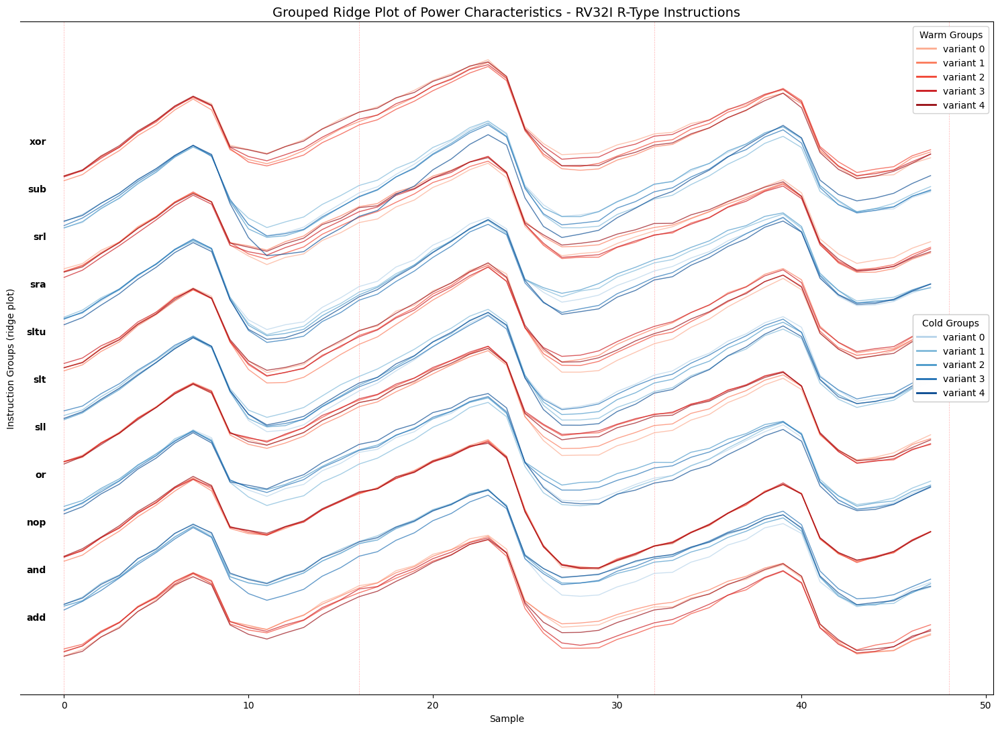

In [67]:
plot_singleton_traces_ridge(datgen, 
                           prune=(head_cycles_empirical, tail_cycles_empirical), 
                           ridge_spacing=1.5, 
                           filter_instructions=R_INSTRUCTIONS,
                           title="Grouped Ridge Plot of Power Characteristics - RV32I R-Type Instructions",
                           save=True,
                           plot_width=15)

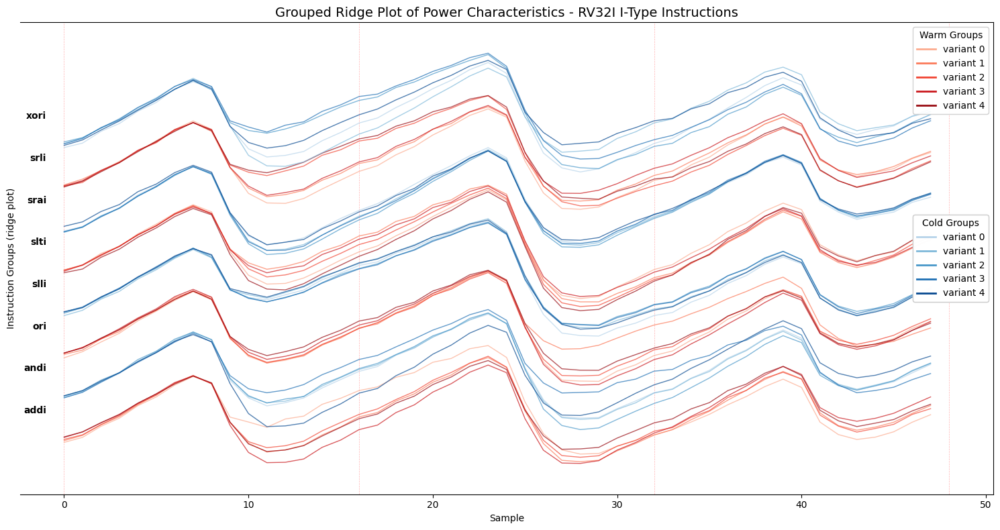

In [66]:
plot_singleton_traces_ridge(datgen, 
                           prune=(head_cycles_empirical, tail_cycles_empirical), 
                           ridge_spacing=1.5, 
                           filter_instructions=I_INSTRUCTIONS,
                           title="Grouped Ridge Plot of Power Characteristics - RV32I I-Type Instructions",
                           save=True,
                           plot_width=15)

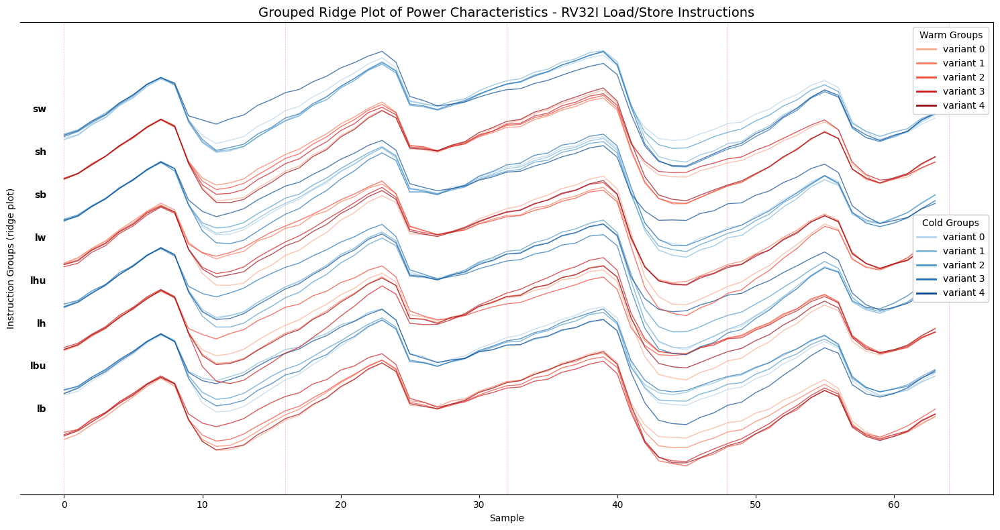

In [64]:
plot_singleton_traces_ridge(datgen, 
                           prune=(head_cycles_empirical, tail_cycles_empirical), 
                           ridge_spacing=1.5, 
                           filter_instructions=LOAD_INSTRUCTIONS+STORE_INSTRUCTIONS,
                           title="Grouped Ridge Plot of Power Characteristics - RV32I Load/Store Instructions",
                           save=True,
                           plot_width=15)

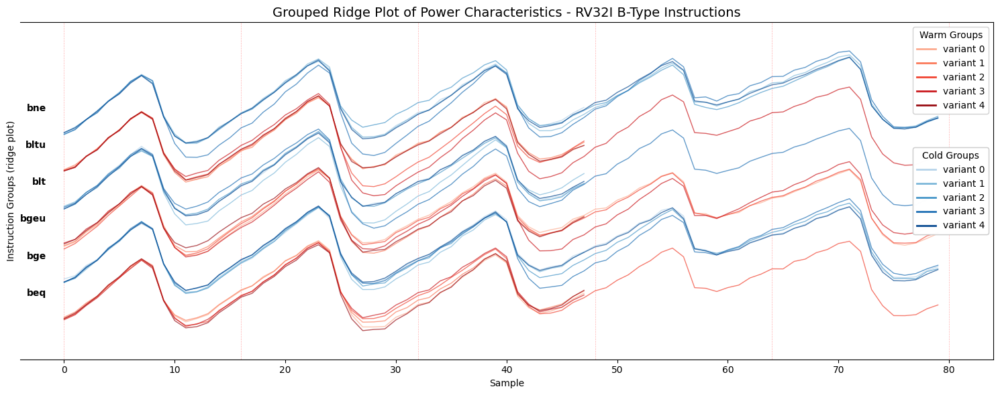

In [60]:
plot_singleton_traces_ridge(datgen, 
                           prune=(head_cycles_empirical, tail_cycles_empirical), 
                           ridge_spacing=1.5, 
                           filter_instructions=B_INSTRUCTIONS,
                           title="Grouped Ridge Plot of Power Characteristics - RV32I B-Type Instructions",
                           save=True,
                           plot_width=15)

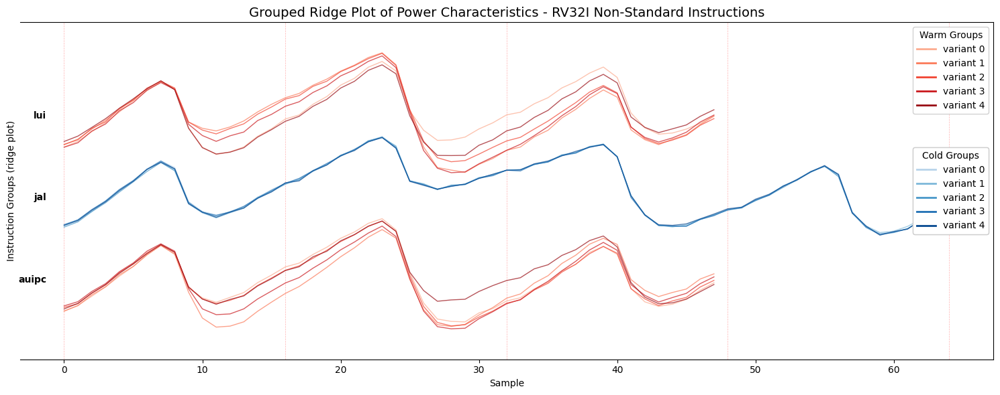

In [58]:
plot_singleton_traces_ridge(datgen, 
                           prune=(head_cycles_empirical, tail_cycles_empirical), 
                           ridge_spacing=3, 
                           filter_instructions=OTHER_INSTRUCTION,
                           height_scale=2, 
                           title="Grouped Ridge Plot of Power Characteristics - RV32I Non-Standard Instructions",
                           save=True,
                           plot_width=15)

## Subset choice

It is clear that apart from jal, there is not much inter-group variation. So to create a mutually distinguishable subset, I will select from each distinct group.

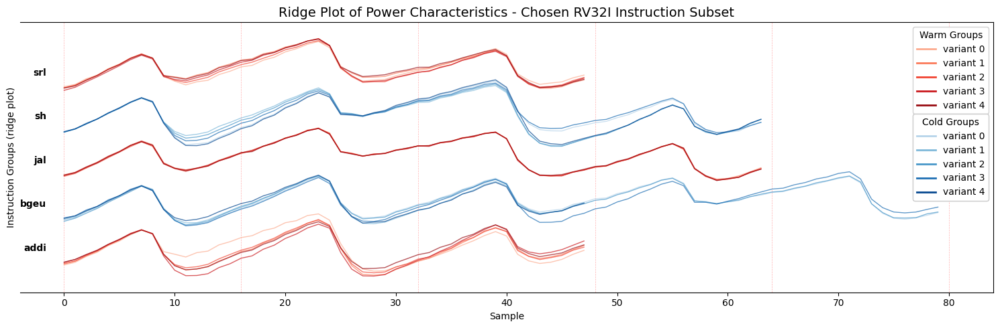

In [55]:
subset = ['srl', 'addi', 'sh', 'jal', 'bgeu']
plot_singleton_traces_ridge(datgen, 
                           prune=(head_cycles_empirical, tail_cycles_empirical), 
                           ridge_spacing=3, 
                           filter_instructions=subset,
                           height_scale=1,
                           title="Ridge Plot of Power Characteristics - Chosen RV32I Instruction Subset",
                           save=True,
                           plot_width=15)

## Other visuals

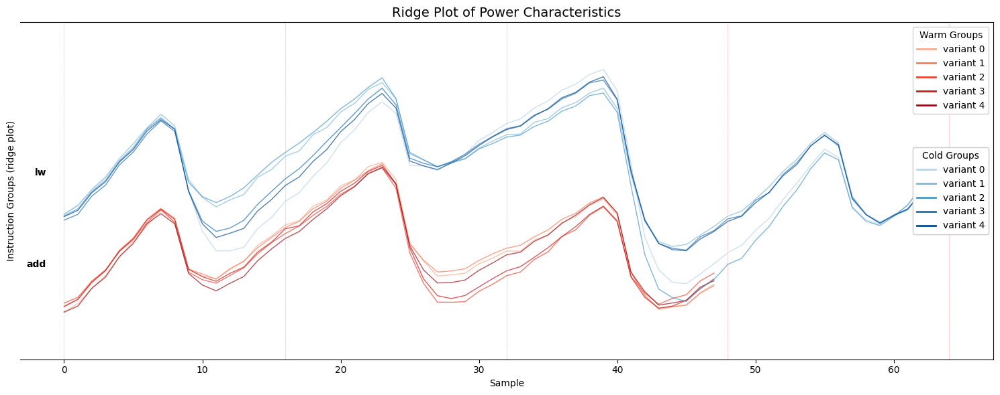

In [54]:
subset = ['add', 'lw']
plot_singleton_traces_ridge(datgen, 
                           prune=(head_cycles_empirical, tail_cycles_empirical), 
                           ridge_spacing=2, 
                           filter_instructions=subset,
                           height_scale=3,
                           title="Ridge Plot of Power Characteristics",
                           save=True,
                           plot_width=15)